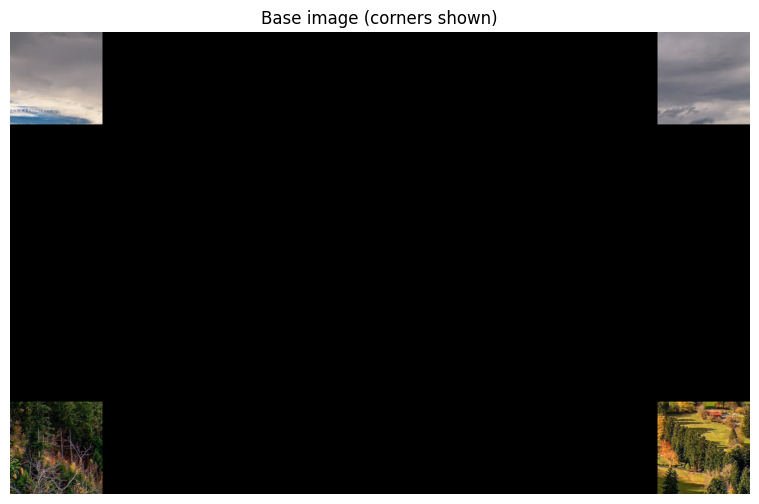

In [41]:
import os
import glob
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import time

folder_path = r"Puzzle_1_40"

output_file = os.path.join(folder_path, "Output.tif")
corners_img = np.array(Image.open(output_file))
base_img = corners_img.copy()

patch_files = sorted(glob.glob(os.path.join(folder_path, "Patch_*.tif")))
patches = [np.array(Image.open(pf)) for pf in patch_files]

plt.figure(figsize=(10,6))
plt.imshow(base_img)
plt.axis('off')
plt.title("Base image (corners shown)")
plt.show()


In [42]:
rows, cols = 5, 8
img_width, img_height = 1920, 1200
patch_width, patch_height = img_width // cols, img_height // rows

def ensure_rgb(p):
    if p.ndim == 2:
        return np.stack([p,p,p], axis=2).astype(np.uint8)
    return p

patches = [ensure_rgb(p) for p in patches]
base_img = ensure_rgb(base_img)


In [43]:
def edge_mse_score(p1, p2, side):

    if side == 'right':
        e1 = p1[:, -1, :].astype(np.int32)
        e2 = p2[:, 0, :].astype(np.int32)
    elif side == 'bottom':
        e1 = p1[-1, :, :].astype(np.int32)
        e2 = p2[0, :, :].astype(np.int32)
    else:
        raise ValueError("side must be 'right' or 'bottom'")
    mse = np.mean((e1 - e2) ** 2)
    return -mse  # smaller MSE => larger score

def show_step(img, title=None, pause_time=0.25):

    plt.clf()
    plt.imshow(img)
    if title:
        plt.title(title)
    plt.axis('off')
    display(plt.gcf())
    plt.pause(pause_time)


In [44]:
def puzzle_solver_show_progress(pause_time=0.25):

    placed = [[None for _ in range(cols)] for _ in range(rows)]
    used = set()

    for r in range(rows):
        for c in range(cols):
            y1, y2 = r * patch_height, (r+1) * patch_height
            x1, x2 = c * patch_width, (c+1) * patch_width
            patch = base_img[y1:y2, x1:x2, :]
            if not np.all(patch == 0):
                placed[r][c] = patch
                for idx, p in enumerate(patches):
                    if np.array_equal(p, patch):
                        used.add(idx)
                        break

    final_img = np.zeros_like(base_img)
    for r in range(rows):
        for c in range(cols):
            if placed[r][c] is not None:
                y1, y2 = r * patch_height, (r+1) * patch_height
                x1, x2 = c * patch_width, (c+1) * patch_width
                final_img[y1:y2, x1:x2, :] = placed[r][c]

    plt.figure(figsize=(12,6))
    show_step(final_img, title="Initial (corners placed)", pause_time=pause_time)

    for r in range(rows):
        for c in range(cols):
            if placed[r][c] is not None:
                continue

            best_idx = None
            best_score = -1e15

            for idx, p in enumerate(patches):
                if idx in used:
                    continue
                score = 0.0
                count = 0
                if c > 0 and placed[r][c-1] is not None:
                    s = edge_mse_score(placed[r][c-1], p, 'right')
                    score += s
                    count += 1
                if r > 0 and placed[r-1][c] is not None:
                    s = edge_mse_score(placed[r-1][c], p, 'bottom')
                    score += s
                    count += 1

                if count > 0:
                    avg_score = score / count
                else:
                    avg_score = score

                if avg_score > best_score:
                    best_score = avg_score
                    best_idx = idx

            placed[r][c] = patches[best_idx]
            used.add(best_idx)
            y1, y2 = r * patch_height, (r+1) * patch_height
            x1, x2 = c * patch_width, (c+1) * patch_width
            final_img[y1:y2, x1:x2, :] = patches[best_idx]

            title = f"Placing patch at row {r}, col {c}"
            show_step(final_img, title=title, pause_time=pause_time)

    plt.show()
    return final_img


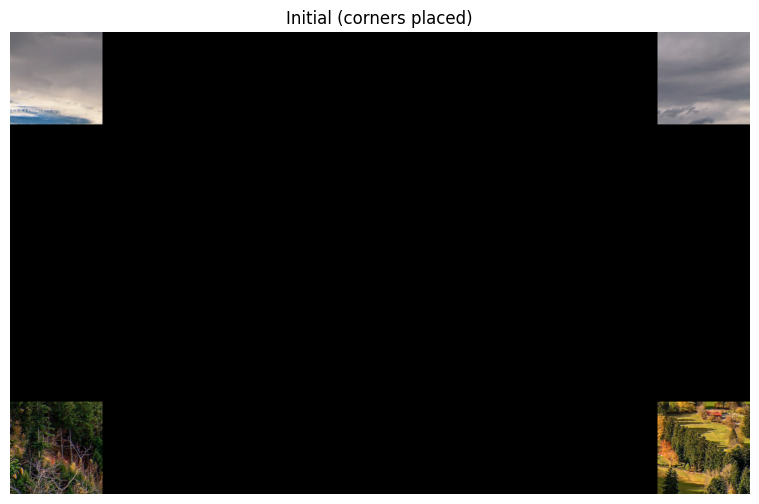

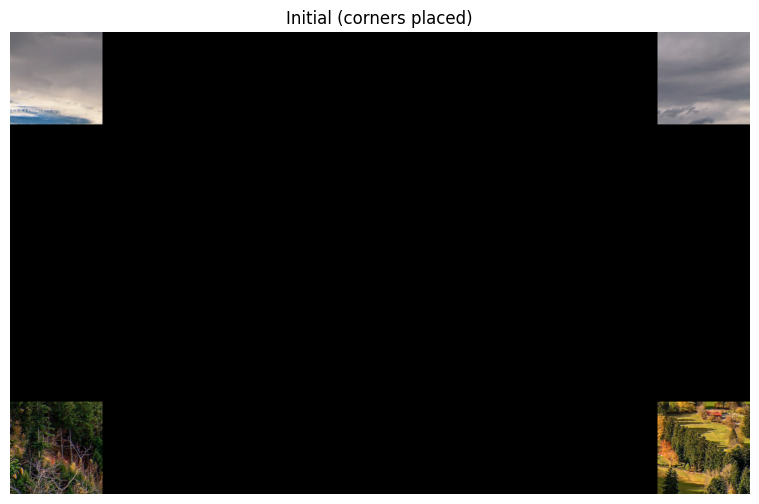

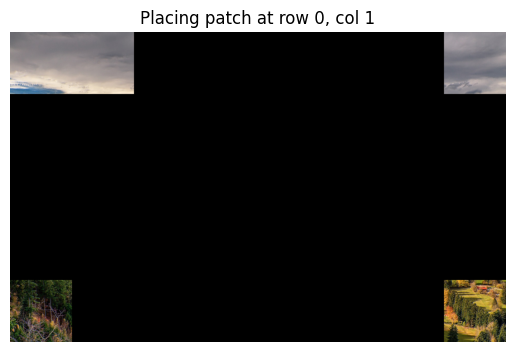

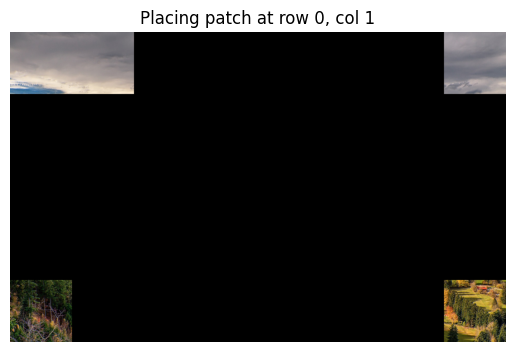

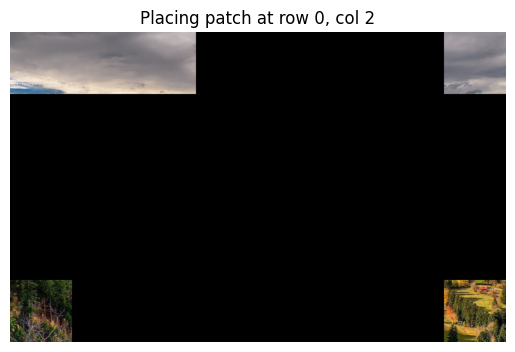

...

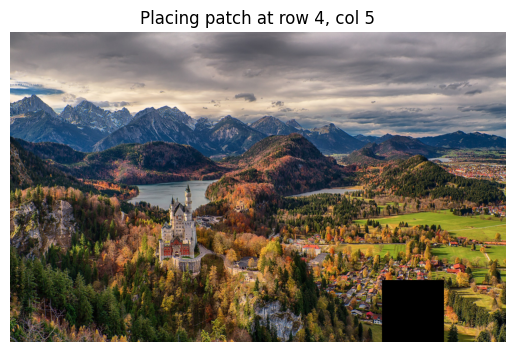

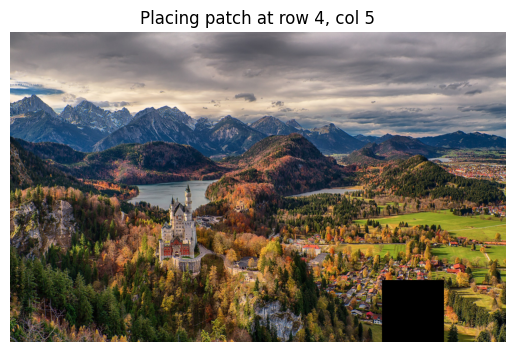

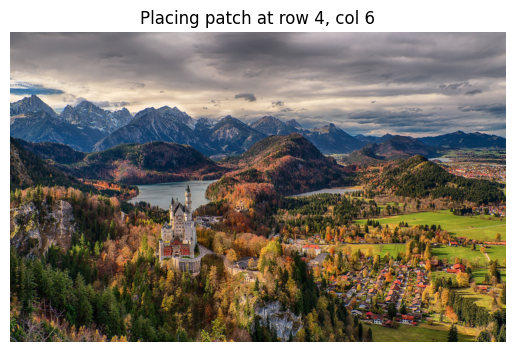

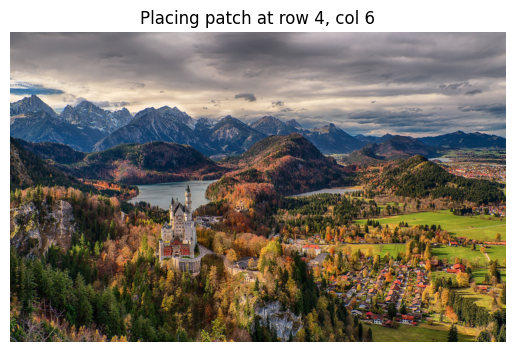

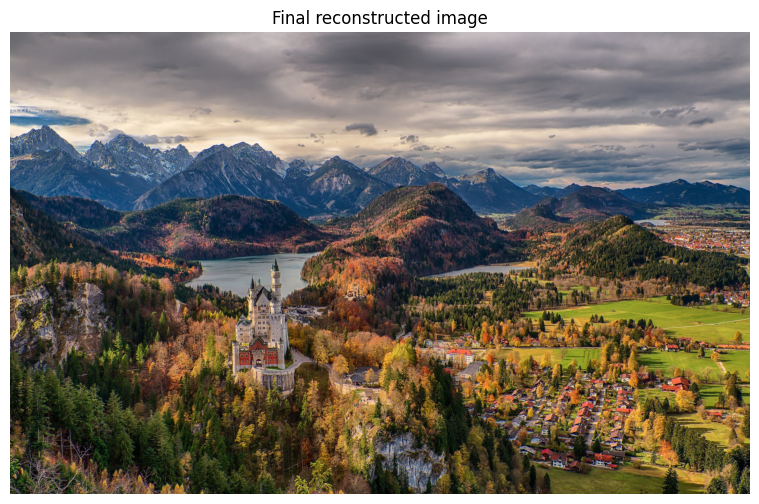

In [45]:
final_img = puzzle_solver_show_progress(pause_time=0.25)

Image.fromarray(final_img).save(os.path.join(folder_path, "final.tif"))

plt.figure(figsize=(12,6))
plt.imshow(final_img)
plt.axis('off')
plt.title("Final reconstructed image")
plt.show()


In [46]:
def accuracy_block_base(original_img, final_img, rows, cols):
    correct_blocks = 0
    total_blocks = rows * cols
    for row in range(rows):
        for col in range(cols):
            patch = final_img[row*patch_height:(row+1)*patch_height, col*patch_width:(col+1)*patch_width]
            original_patch = original_img[row*patch_height:(row+1)*patch_height, col*patch_width:(col+1)*patch_width]
            if np.array_equal(patch, original_patch):
                correct_blocks += 1
    return 100 * correct_blocks / total_blocks

original_img = np.array(Image.open(os.path.join(folder_path, "Original.tif")))
accuracy = accuracy_block_base(original_img, final_img, rows, cols)
print(f"Accuracy: {accuracy:.2f}%")


Accuracy: 100.00%
